# (01) Best fits

**Motivation**: Best ```MNIST``` and ```CIFAR10-PATCHES``` fits as of May 1, 2024. Device = ```cuda:0``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 0
device = f'cuda:{device_idx}'

model_type = 'poisson'

## MNIST

architecture: ```<CONV|CONV>```

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST', model_type)
print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'prior_clamp': -3.0, 'prior_log_dist': 'uniform', 'rmax_q': 1.0, 'n_ch': 32, 'n_latents': 10, 
'enc_type': 'conv', 'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True, 'weight_norm': False}

Trainer:
{'temp_anneal_portion': 0.5, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 0.05, 'lr': 0.002, 
'epochs': 900, 'batch_size': 200, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 'grad_clip': 1000}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  PoissonVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   2.6 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

poisson_uniform_c(-3)_rmax(1)_MNIST_z-10_k-32_<conv+b|conv+b>
mc_b200-ep900-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_02,09:36)

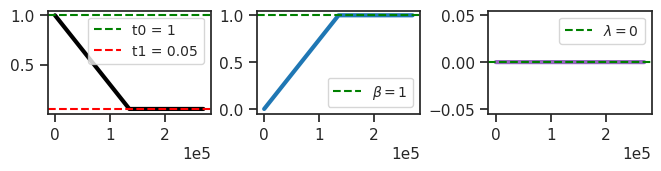

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [5]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([10]))

In [6]:
print(vae)

PoissonVAE(
  (mse): MSELoss()
  (stem): Conv2D(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=valid)
  (enc): Sequential(
    (0): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=32, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=32, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (1): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(32, 64, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (2): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=64, out_features=4, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=4, out_features=64, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (3): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(64, 128, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (4): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=128, out_features=8, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=8, out_features=128, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (5): Cell(
      (skip): StrideReduce(
        (swish): SiLU()
        (conv): Conv2D(128, 256, kernel_size=(1, 1), stride=(2, 2))
      )
      (ops): ModuleList(
        (0): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        )
        (1): ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
      (se): SELayer(
        (fc): Sequential(
          (0): Linear(in_features=256, out_features=16, bias=True)
          (1): ReLU(inplace=True)
          (2): Linear(in_features=16, out_features=256, bias=True)
          (3): Sigmoid()
        )
      )
    )
    (6): Cell(
      (skip): Identity()
      (ops): ModuleList(
        (0-1): 2 x ConvLayer(
          (act_fn): SiLU()
          (conv): Conv2D(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
    

### Train
- takes ~2.5 hours

In [ ]:
"""
# comment = f"..._{tr.cfg.name()}"
comment = tr.cfg.name()
tr.train(comment=comment)
"""

### Load model

In [7]:
tr, meta = load_model_lite(
    path=pjoin(tmp_dir, 'Dekel', 'pois-conv-mnist'),
    device=device,
    verbose=True,
)
print(meta)

# params: 6.2 M

{
    'timestamp': '2024_04_30,21:50',
    'checkpoint': 900,
    'global_step': 270000,
    'file': 'PoissonVAE+TrainerVAE-0900_(2024_05_01,00:24).pt',
    'path': '/home/hadi/Dropbox/git/jb-vae/tmp/Dekel/pois-conv-mnist'
}

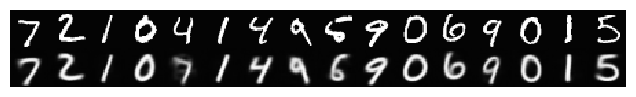

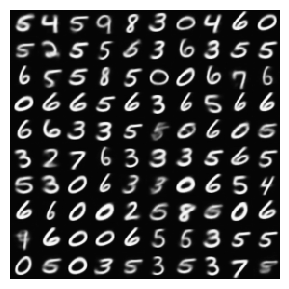

In [8]:
tr.show_recon(t=0.0), tr.show_samples(t=0.0);

### Loss vld
- default: freezes (temp = 0.0)

In [9]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 27.323044, 'kl': 9.145828, 'kl_diag': 0.91458285, 'tot': 36.468872}

### Identify dead neurons

In [10]:
dead_thres = 0.0
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [11]:
loss['kl_diag']

array([0.92014444, 0.85835016, 0.7852803 , 0.736939  , 0.94743544,
       1.0657085 , 0.92083704, 0.9868529 , 0.90971357, 1.0145661 ],
      dtype=float32)

### Spike counts

In [12]:
lifetime, population, percents = sparse_score(data['z'], cutoff=0.01)
print(percents)

{'0': 55.5, '1': 12.2, '2': 11.2, '3': 8.8, '4': 5.5, '5': 3.4, '6': 1.8, '7': 0.8, '8+': 0.8}

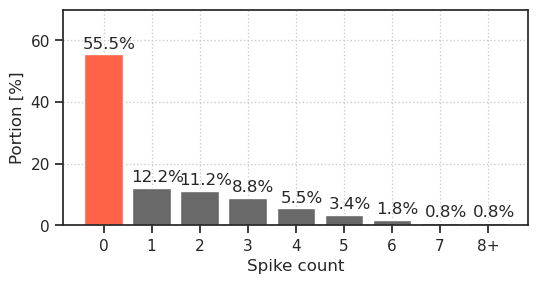

In [13]:
fig, ax = create_figure(1, 1, (6, 2.8))

max_val = float(list(percents.values())[0])
ax.set(
    xlabel='Spike count',
    ylabel='Portion [%]',
    ylim=(0, (np.ceil(max_val / 10) + 1) * 10),
)

colors = ['tomato' if lbl == '0' else 'dimgrey' for lbl in percents]
bars = ax.bar(percents.keys(), percents.values(), color=colors)

for bar in bars:
    y = bar.get_height()
    x = bar.get_x() + 1.3 * bar.get_width() / 2
    plt.text(x, y + 1, f'{y:0.1f}%', ha='center', va='bottom')

ax.locator_params(axis='y', nbins=5)

ax.grid()
plt.show()

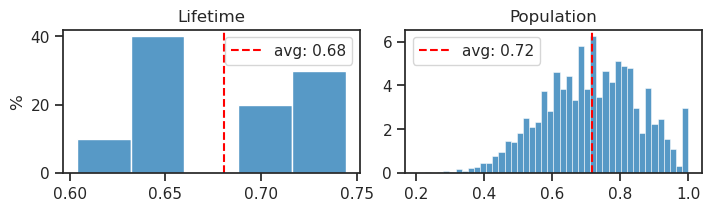

In [14]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

In [15]:
tot_nspks = data['z'][:, ~dead].sum(1)
tot_firing = (data['z'][:, ~dead] > 0).mean(1)

min(tot_nspks), max(tot_nspks)

(0.0, 38.0)

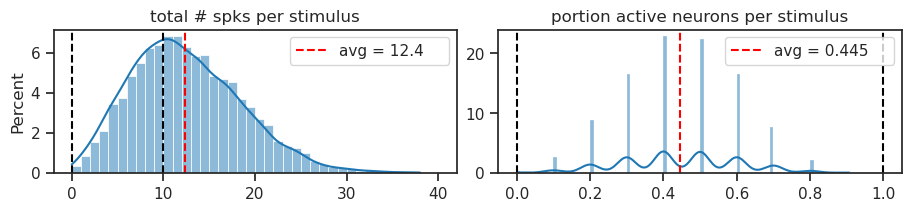

In [16]:
a = np.floor(min(tot_nspks) / 10) * 10
b = np.ceil(max(tot_nspks) / 10) * 10

fig, axes = create_figure(1, 2, (9, 2), layout='constrained')

sns.histplot(tot_nspks, bins=np.linspace(a, b, int(b - a) + 1), kde=True, stat='percent', ax=axes[0])
sns.histplot(tot_firing, bins=np.linspace(0, 1.0, 101), kde=True, stat='percent', ax=axes[1])

_a = tot_nspks.mean()
axes[0].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.1f}    ')
_a = tot_firing.mean()
axes[1].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.3f}    ')

axes[0].axvline(vae.cfg.n_latents, color='k', ls='--')
axes[1].axvline(1.0, color='k', ls='--')

axes[0].set_title('total # spks per stimulus')
axes[1].set(title='portion active neurons per stimulus', ylabel='')

for ax in axes.flat:
    ax.axvline(0, color='k', ls='--')
    ax.legend()
plt.show()

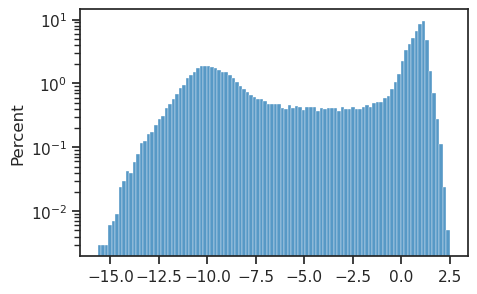

In [17]:
ax = sns.histplot(np.log(etc['r*dr'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

In [18]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['r*dr'][:, i],
        f'z-{j}': etc['r*dr'][:, j],
        f'z-{i}_log': np.log(etc['r*dr'][:, i]),
        f'z-{j}_log': np.log(etc['r*dr'][:, j]),
        'lbl': tonp(tr.dl_vld.dataset.tensors[1]).astype(int),
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

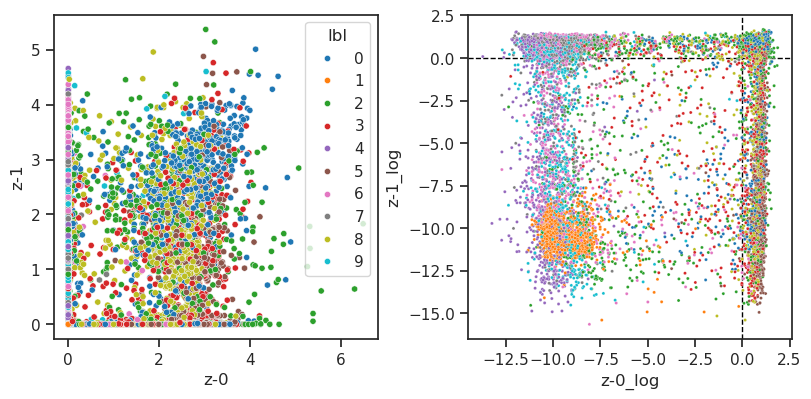

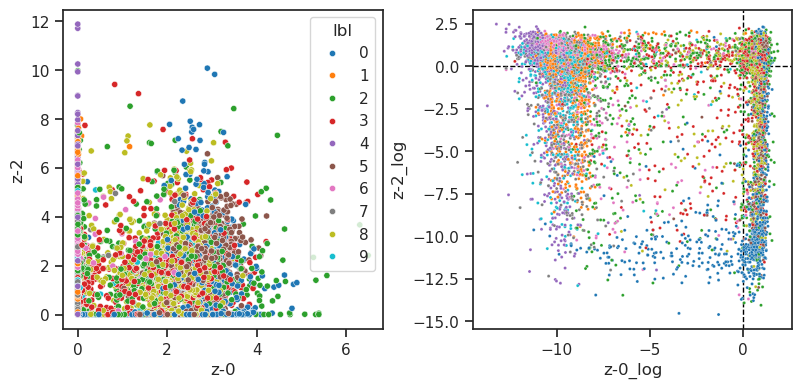

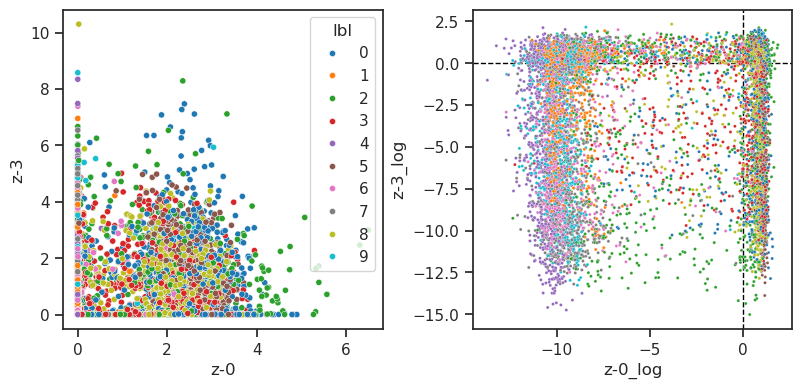

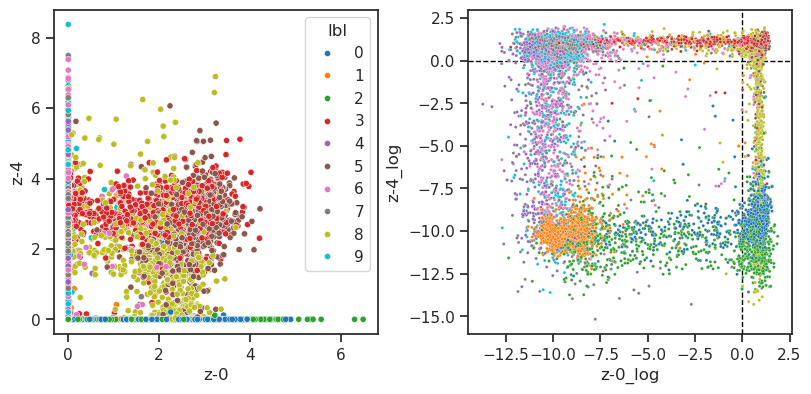

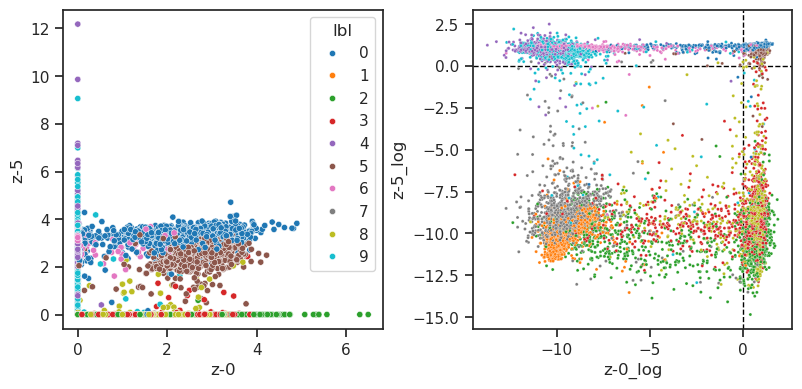

...

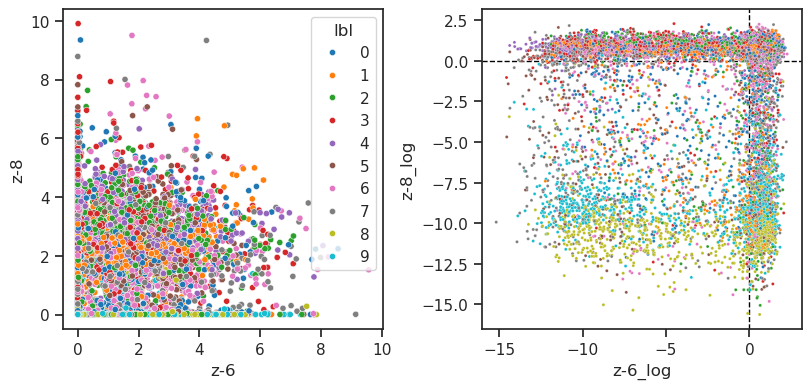

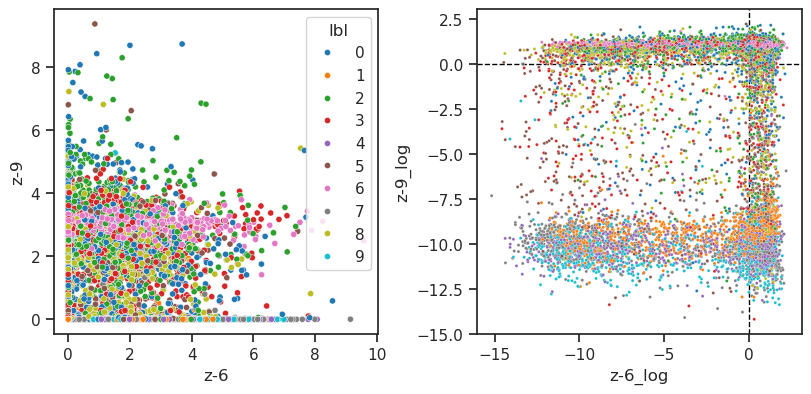

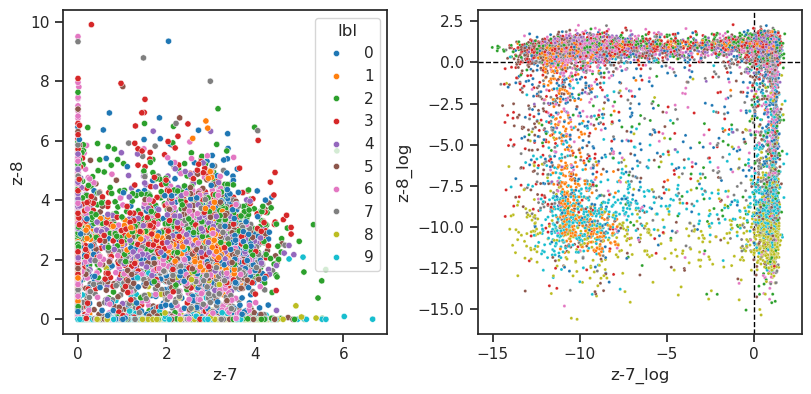

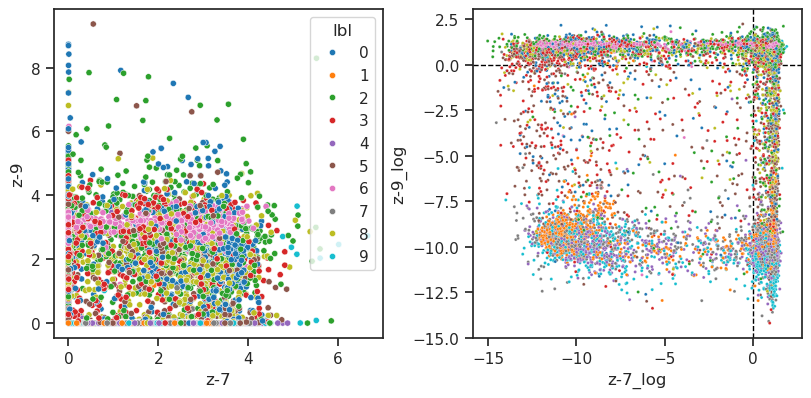

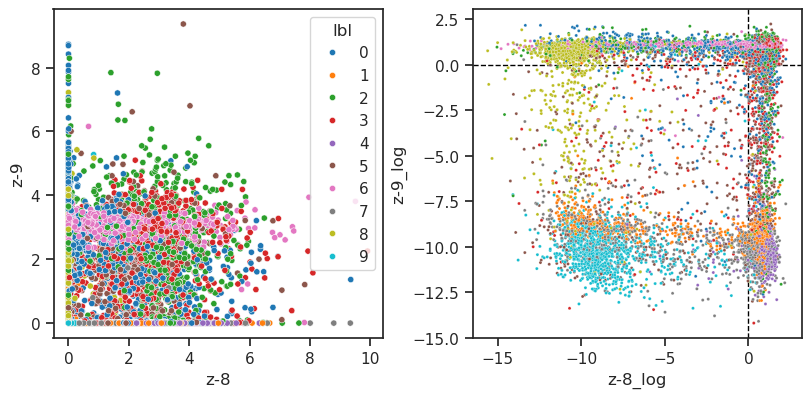

In [19]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

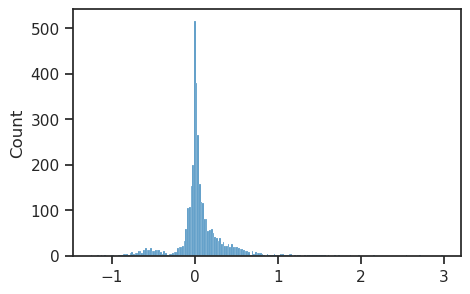

In [20]:
sns.histplot(tonp(torch.cat(tr.model.all_lognorm)));

In [21]:
(np.array(list(tr.stats['grad'].values())) > 500).sum() / len(tr.stats['grad'])

0.009703703703703704

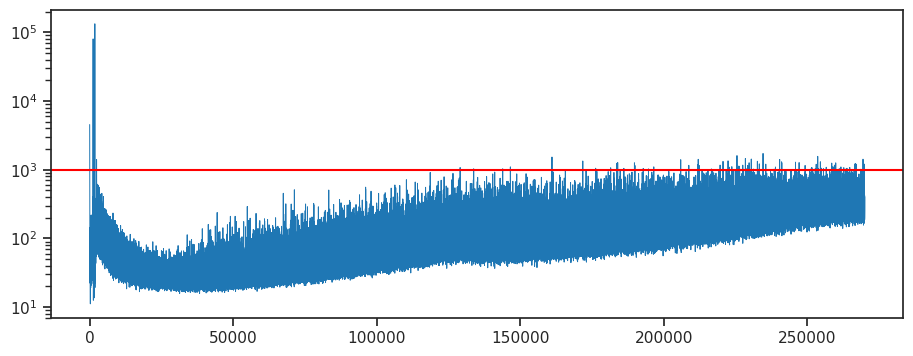

In [22]:
fig, ax = create_figure(1, 1, (11, 4))
plt.plot(tr.stats['grad'].keys(), tr.stats['grad'].values(), lw=0.7)
ax.axhline(tr.cfg.grad_clip, color='r')
ax.set(yscale='log')
plt.show()

In [23]:
df, df_summary = knn_analysis(
    x=etc['log_dr'],
    y=tonp(tr.dl_vld.dataset.tensors[1]).astype(int),
    n_iter=100,
    verbose=True,
)

train sample size: 5000, iter #0: 100%|█████████████████| 801/801 [01:40<00:00,  7.93it/s]


In [24]:
df_summary

,mean,std
size,,
20,0.418638,0.062253
50,0.658010,0.055708
100,0.796354,0.034670
200,0.882576,0.021348
500,0.936824,0.010214
1000,0.953332,0.007023
2000,0.960502,0.005561
4000,0.963162,0.002998
5000,0.962600,NaN


## CIFAR10-PATCHES

architecture: ```<MLP|LIN>```

In [25]:
cfg_vae, cfg_tr = default_configs('CIFAR10-PATCHES', model_type)
cfg_vae['enc_type'] = 'mlp'
cfg_vae['enc_bias'] = True

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'CIFAR10-PATCHES', 'prior_clamp': -3.0, 'prior_log_dist': 'uniform', 'rmax_q': 1.0, 'n_ch': 16, 
'n_latents': 512, 'enc_type': 'mlp', 'dec_type': 'lin', 'enc_bias': True, 'dec_bias': False}

Trainer:
{'temp_anneal_portion': 1.0, 'temp_anneal_type': 'exp', 'temp_start': 1.0, 'temp_stop': 0.05, 'lr': 0.005, 
'epochs': 3600, 'batch_size': 1000, 'optimizer_kws': {'weight_decay': 0.0}, 'grad_clip': 500}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  PoissonVAE |  2.4 Mil   |
|     ---     |    ---     |
|     enc     |  2.1 Mil   |
|    fc_enc   |  131.6 K   |
|    fc_dec   |  131.1 K   |
+-------------+------------+

poisson_uniform_c(-3)_rmax(1)_CIFAR10-PATCHES_z-512_k-16_<mlp+b|lin>
mc_b1000-ep3600-lr(0.005)_beta(1:0x0.5)_temp(0.05:exp-1)_gr(500)_(2024_05_02,09:39)

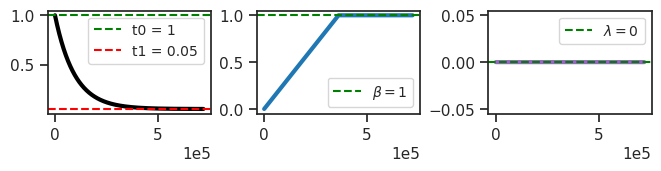

In [26]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [27]:
vae.fc_dec.bias, vae.fc_enc.bias.shape

(None, torch.Size([512]))

In [28]:
print(vae)

PoissonVAE(
  (mse): MSELoss()
  (enc): ResDenseLayer(
    (fc1): Linear(in_features=256, out_features=4096, bias=True)
    (fc2): Linear(in_features=4096, out_features=256, bias=True)
    (layer_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
    (drop): Dropout(p=0.1, inplace=False)
    (relu): ReLU()
  )
  (fc_enc): Linear(in_features=256, out_features=512, bias=True)
  (fc_dec): Linear(in_features=512, out_features=256, bias=False)
)

### Train
- takes ~1.5 hours

In [ ]:
"""
# comment = f"..._{tr.cfg.name()}"
comment = tr.cfg.name()
tr.train(comment=comment)
"""

### Load model

In [29]:
tr, meta = load_model_lite(
    path=pjoin(tmp_dir, 'Dekel', 'pois-mlp'),
    device=device,
    verbose=True,
)
print(meta)

# params: 2.4 M

{
    'timestamp': '2024_05_01,17:46',
    'checkpoint': 3600,
    'global_step': 720000,
    'file': 'PoissonVAE+TrainerVAE-3600_(2024_05_01,19:18).pt',
    'path': '/home/hadi/Dropbox/git/jb-vae/tmp/Dekel/pois-mlp'
}

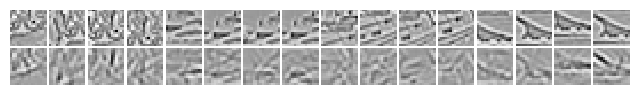

In [30]:
tr.show_recon(t=0.0, pad=1);

### Loss vld
- default: freezes (temp = 0.0)

In [31]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 128.57693, 'kl': 34.691856, 'kl_diag': 0.06775753, 'tot': 163.2688}

### Dead neurons

In [32]:
dead_thres = 0.01
dead = loss['kl_diag'] < dead_thres
dead.sum()

4

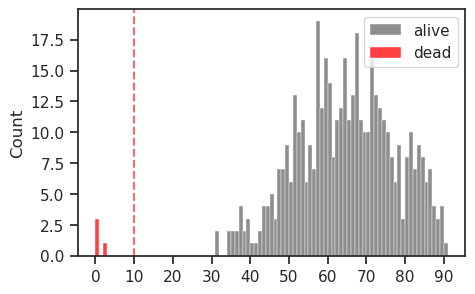

In [33]:
bins = np.linspace(0, 91, 92)
ax = sns.histplot(loss['kl_diag'][~dead] * 1000, bins=bins, color='dimgrey', label='alive')
sns.histplot(loss['kl_diag'][dead] * 1000, bins=bins, color='r', label='dead', ax=ax)
ax.axvline(dead_thres * 1000, color='r', ls='--', alpha=0.6)
ax.locator_params(axis='x', nbins=11)
ax.legend()
plt.show()

### Sparse score

In [34]:
lifetime, population, percents = sparse_score(data['z'][:, ~dead], cutoff=0.05)
print(percents)

{'0': 93.0, '1': 6.1, '2': 0.7, '3+': 0.2}

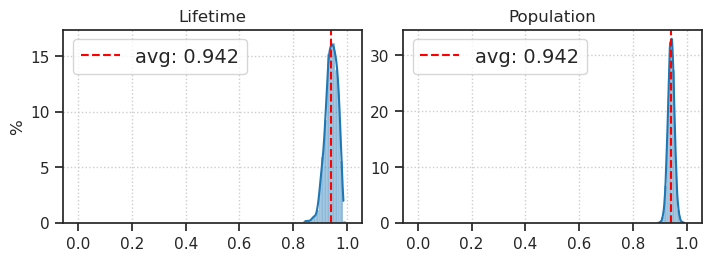

In [48]:
fig, axes = create_figure(1, 2, (7, 2.5), layout='constrained')

kws = dict(stat='percent', kde=True, bins=np.linspace(0, 1.01, 102) - 0.005)
sns.histplot(lifetime, ax=axes[0], **kws)
sns.histplot(population, ax=axes[1], **kws)

for i, x2p in enumerate([lifetime, population]):
    _a = np.nanmean(x2p)
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.3g}')

axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
add_legend(axes, fontsize=14)
add_grid(axes)

plt.show()

### Plot dictionary

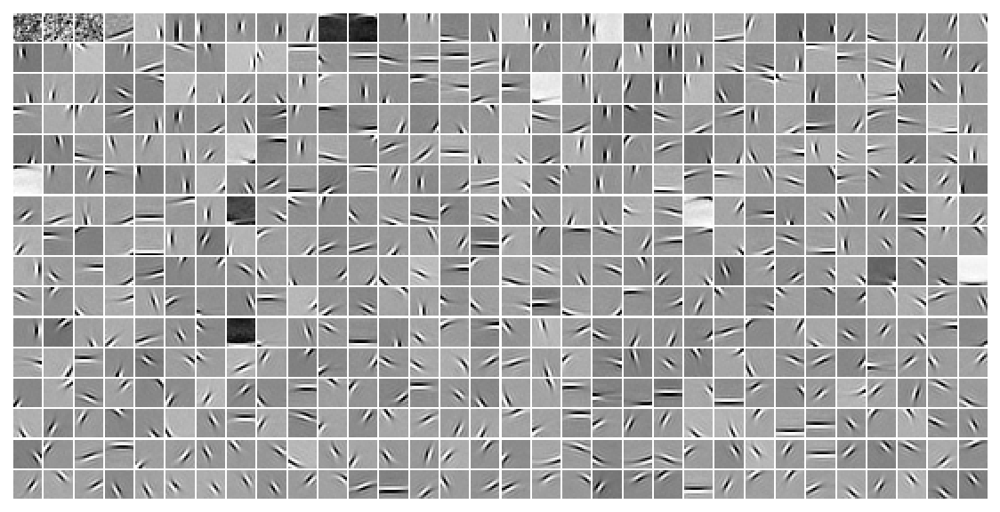

In [49]:
tr.model.show(dpi=150, order=np.argsort(loss['kl_diag']));

### Loggabor analysis

In [50]:
from analysis.eval import fit_loggabor
from figures.theta import plot_theta
from figures.imgs import plot_weights

In [51]:
results = fit_loggabor(tr, verbose=True)

100%|███████████| 512/512 [00:14<00:00, 35.09it/s]


In [52]:
results.loc[results['sf_0'] > 10, 'sf_0'] = np.nan
results.iloc[np.logical_or(dead, np.isnan(results['theta']))] = np.nan
results.describe()

,x_pos,y_pos,theta,sf_0,phase,B_sf,B_theta,theta_deg,r_prior
count,5.080000e+02,508.000000,508.000000,508.000000,508.000000,508.000000,508.000000,508.000000,508.000000
mean,7.803936e+00,7.580709,0.102816,0.273024,-0.094729,0.579469,0.316762,90.575963,0.084335
std,4.280625e+00,4.233778,0.898261,0.059279,1.704661,0.110076,0.235642,53.299056,0.034252
min,1.102653e-08,0.215142,-1.570796,0.165162,-3.526949,0.400000,0.079876,0.001965,0.019746
25%,4.179473e+00,3.739308,-0.687245,0.256889,-1.645859,0.504959,0.251537,45.708179,0.058335
50%,7.999879e+00,7.654267,0.011595,0.264925,-0.549271,0.549707,0.292111,89.567935,0.080581
75%,1.159731e+01,11.570960,0.867198,0.275425,1.570471,0.631772,0.347842,135.726911,0.105613
max,1.482812e+01,14.521271,1.570796,1.300415,3.616241,1.200598,4.957411,179.972778,0.224481


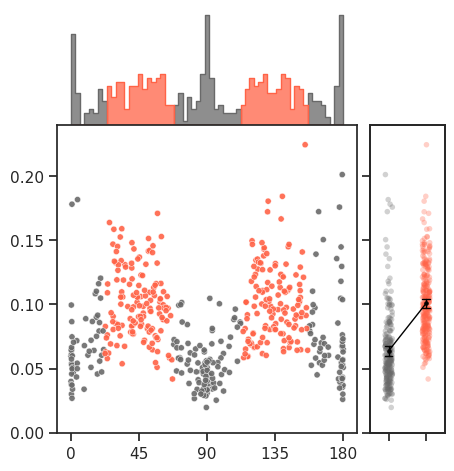

In [53]:
fig, _ = plot_theta(results, ylim=(-0.0, 0.24))

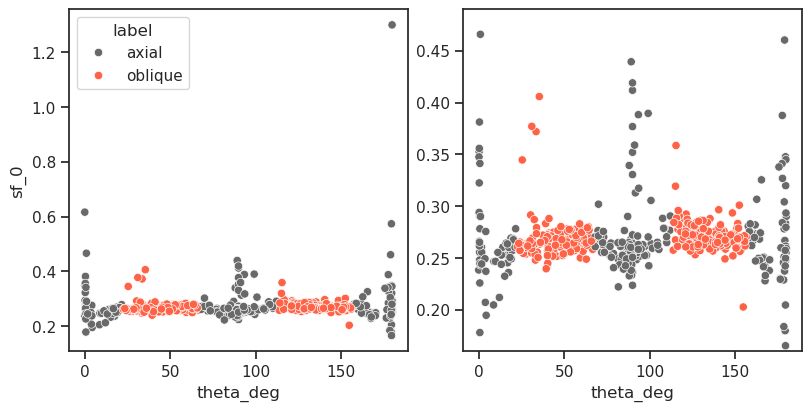

In [54]:
pal = {'axial': 'dimgrey', 'oblique': 'tomato'}

fig, axes = create_figure(1, 2, (8, 4), layout='constrained')
sns.scatterplot(data=results, y='sf_0', x='theta_deg', hue='label', palette=pal, ax=axes[0])
sns.scatterplot(data=results, y='sf_0', x='theta_deg', hue='label', palette=pal, ax=axes[1])
axes[1].set(ylim=(0.16, 0.49), ylabel='')
move_legend(axes[1])
plt.show()

In [55]:
rates_axial = results.loc[(results['label'] == 'axial') & ~dead, 'r_prior'].values
rates_oblique = results.loc[(results['label'] == 'oblique') & ~dead, 'r_prior'].values

print(f"{sp_stats.mannwhitneyu(rates_axial, rates_oblique, method='auto')}")

MannwhitneyuResult(statistic=9575.0, pvalue=6.185640781682435e-42)

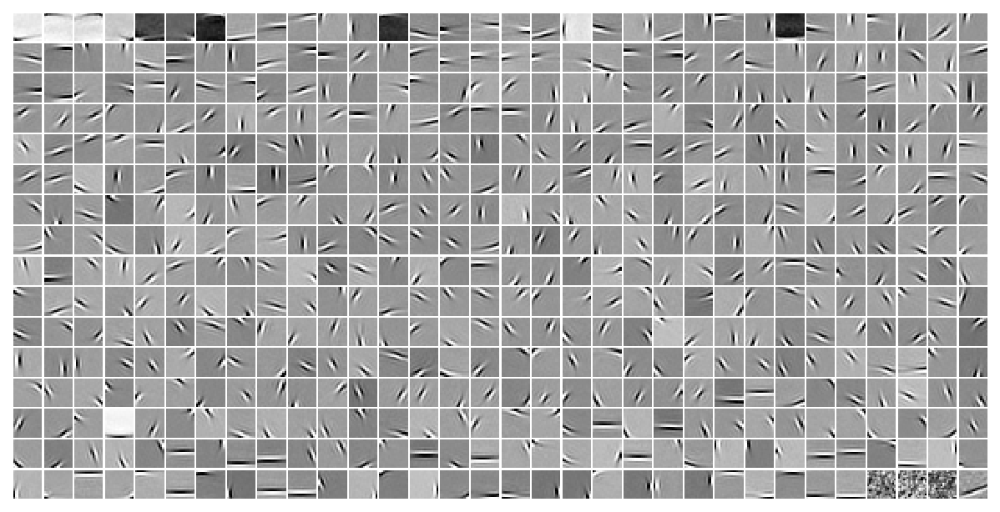

In [56]:
order = np.argsort(results['sf_0'].values)
_ = tr.model.show(order=order)

In [57]:
w_dec = tonp(tr.model.fc_dec.weight.data)
w_dec = w_dec.T.reshape(-1, 16, 16)
ids = np.argsort(results['sf_0'].values)

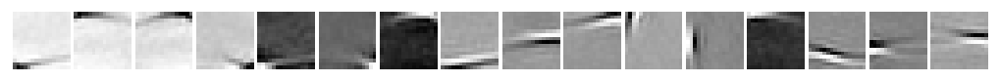

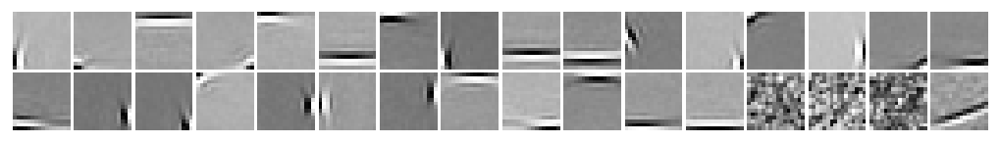

In [58]:
plot_weights(w_dec[ids[:16]], nrows=1, dpi=130)
plt.show()

plot_weights(w_dec[ids[-32:]], nrows=2, dpi=130)
plt.show()